In [ ]:
#!pip install keplergl

In [1]:
import numpy as np
import pandas as pd

import scipy.stats as stats
# import statsmodels.robust as robust

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from keplergl import KeplerGl
# import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns', 50)

In [3]:
df = pd.read_csv('./data/kc_house_data.csv')
df.head(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


| Название признака | Описание |
| ---: | :--- |
| id | идентификационный номер дома |
| date | дата продажи |
| price | стоимость |
| bedrooms | кол-во спален |
| bathrooms | кол-во ванных комнат (0.25 - комната с туалетом, 0.5 - комната с туалетом и раковиной) |
| sqft_living | жилая площадь |
| sqft_lot | площадь прилегающего участка |
| floors | кол-во этажей |
| waterfront | вид на набережную |
| view | оценка внешнего вида |
| condition | оценка состояния |
| grade | оценка качества строительства и дизайна здания |
| sqft_above | площадь наземной части |
| sqft_basement | площадь подземной части |
| yr_built | год строительства дома |
| yr_renovated | год последнего ремонта или реконструкции |
| zipcode | почтовый индекс |
| lat | широта |
| long | долгота |

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [5]:
df['date']= pd.to_datetime(df['date'], format='%Y%m%dT%H%M%S')

In [6]:
df.duplicated('id').sum()

177

In [7]:
df['rn'] = df.groupby('id')['date'].rank(ascending=False)
df['rn'].value_counts()

rn
1.0    21436
2.0      176
3.0        1
Name: count, dtype: int64

In [8]:
df = df[df['rn'] == 1].reset_index(drop=True)
# df

In [9]:
df['price'] = df['price']/1_000

In [10]:
df[['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
    'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']].describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,sqft_living15,sqft_lot15
count,21436.000000,21436.000000,21436.000000,21436.000000,2.143600e+04,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000
mean,541.649963,3.371571,2.117349,2082.704936,1.513564e+04,1.496198,0.007604,0.235118,3.410384,7.661737,1790.960440,291.744495,1988.314378,12785.961280
std,367.314929,0.929205,0.769913,919.146469,4.153862e+04,0.540388,0.086871,0.767092,0.650235,1.174256,829.026491,442.781983,685.699093,27375.467469
min,75.000000,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,399.000000,651.000000
25%,324.866000,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1490.000000,5100.000000
50%,450.000000,3.000000,2.250000,1920.000000,7.614000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1840.000000,7620.000000
75%,645.000000,4.000000,2.500000,2550.000000,1.069625e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2220.000000,560.000000,2370.000000,10087.250000
max,7700.000000,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,6210.000000,871200.000000


В количестве спален есть аномалии/выбросы: максимум 33 при среднем = 3.37 и медаине = 3

In [11]:
df[df['bedrooms']==33]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,rn
15724,2402100895,2014-06-25,640.0,33,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700,1.0


In [12]:
fltr = df['bedrooms']==33
df[fltr]['sqft_living']/df[fltr]['bedrooms']/10.764

15724    4.560657
dtype: float64

In [13]:
fltr = (df['sqft_living']==1620) & (df['bedrooms']<33)
(df[fltr]['sqft_living']/df[fltr]['bedrooms']/10.764).mean()

51.19104497986485

In [14]:
df.drop(df[df['bedrooms']==33].index, inplace=True)

In [15]:
df[['date','yr_built', 'yr_renovated']].describe()

,date,yr_built,yr_renovated
count,21435,21435.000000,21435.000000
mean,2014-10-29 17:38:33.170049024,1971.099557,84.733753
min,2014-05-02 00:00:00,1900.000000,0.000000
25%,2014-07-22 00:00:00,1952.000000,0.000000
50%,2014-10-17 00:00:00,1975.000000,0.000000
75%,2015-02-18 00:00:00,1997.000000,0.000000
max,2015-05-27 00:00:00,2015.000000,2015.000000
std,NaN,29.385501,402.439983


In [16]:
df[['zipcode', 'lat', 'long']].describe()

,zipcode,lat,long
count,21435.000000,21435.000000,21435.000000
mean,98077.861115,47.560150,-122.213692
std,53.470342,0.138602,0.140897
min,98001.000000,47.155900,-122.519000
25%,98033.000000,47.471100,-122.328000
50%,98065.000000,47.572000,-122.230000
75%,98117.000000,47.678000,-122.124000
max,98199.000000,47.777600,-121.315000


In [17]:
target = 'price'

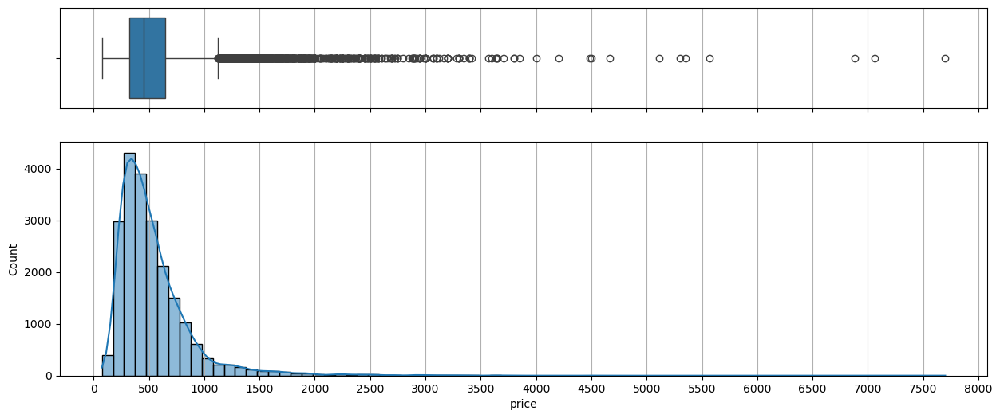

In [18]:
fig, ax = plt.subplots(2, 1, figsize=(15, 6), sharex=True, gridspec_kw = {'height_ratios': (.3, .7)})

sns.boxplot(data=df, x=target, ax=ax[0])
sns.histplot(data=df, x=target, binwidth=100, kde=True, ax=ax[1])

ticks = np.arange(0,8500,500)
for i in range(2):
    ax[i].set_xticks(ticks)
    ax[i].grid(axis='x')

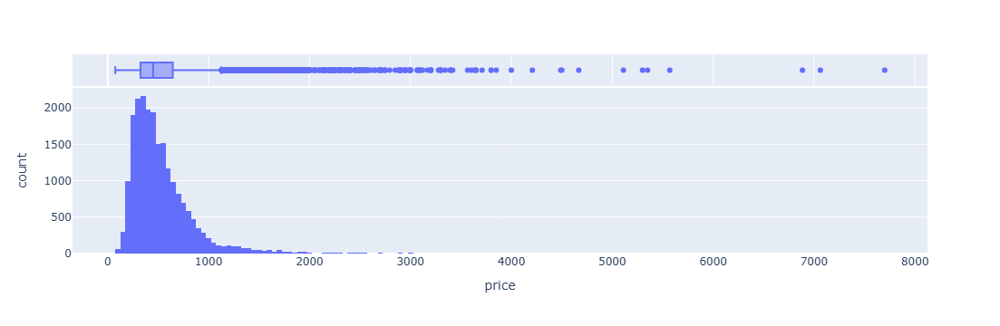

In [19]:
px.histogram(df, x = target, nbins = 200, marginal = 'box')

Стоимость недвижимости варьируется от 75 тыс. до 7.7 млн. долларов(?). При этом 95% домов были проданы в пределе 1.2 млн.\
Средняя стоимость дома 541 тыс. при медиане 450 тыс., что так же говорит о скошенности (ассиметрии) распределения.\
В основном продаются дома от 325 тыс. до 645 тыс. долларов.

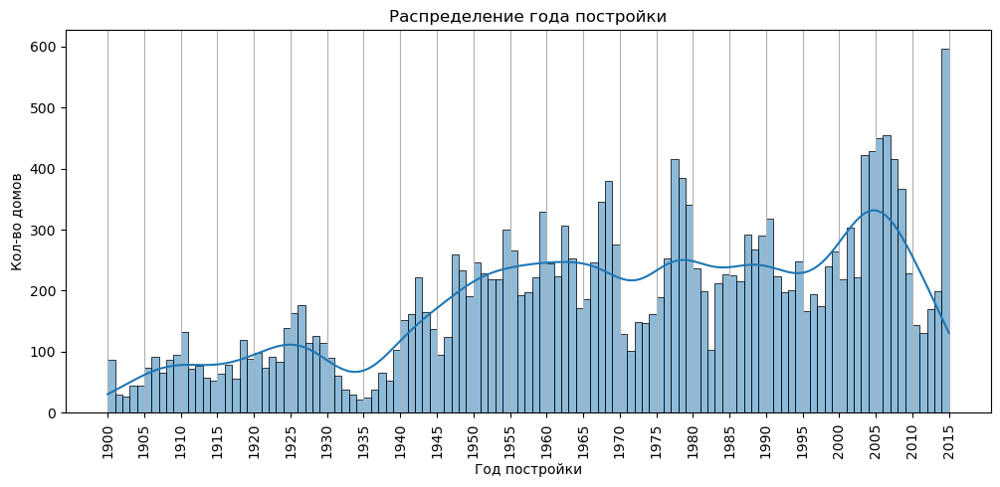

In [20]:
plt.figure(figsize=(12, 5))

sns.histplot(data=df, x='yr_built', binwidth=1, kde=True)

ticks = np.arange(df['yr_built'].min(),df['yr_built'].max()+1,5)
plt.xticks(ticks=ticks, rotation = 90)
plt.title('Распределение года постройки')
plt.xlabel('Год постройки')
plt.ylabel('Кол-во домов')
plt.grid(axis='x');

В наших данных самый старый дом 1900 года посторойки, а самый новый 2015 года. Большие "провалы" на гистограмме распределения года постройки совпадают с кризисами в США, что, скорее всего, говорит о снижении уровня застройки в эти годы.

In [21]:
df['age'] = df['date'].dt.year - df['yr_built']

Разделим признаки на числовые и категориальные.

In [22]:
num_var = ['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'yr_built', 'age', 'yr_renovated']
cat_var = ['bedrooms', 'bathrooms', 'floors', 'view', 'condition', 'grade', 'waterfront']

Построим корреляционную матрицу для числовых признаков.

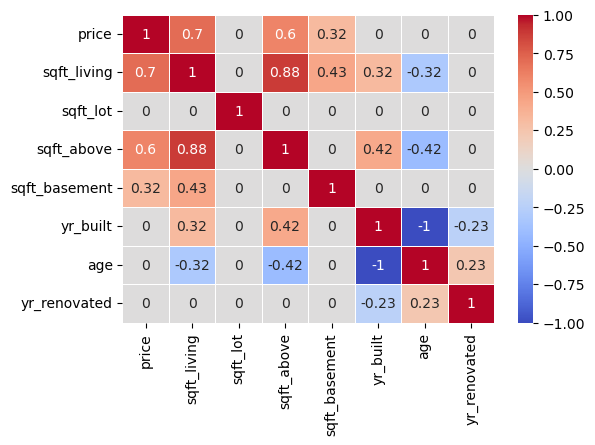

In [23]:
data = df[[target] + num_var]

corr_matrix = np.round(data.corr(),2)
corr_matrix[np.abs(corr_matrix)<=0.2] = 0
plt.figure(figsize=(6, 4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths= 0.5);

**Заметная** корреляционная связь стоимости дома с\
жилой площадью (sqft_living)\
площадью наземной части (sqft_above)

**Слабая** корреляционная связь с\
площадью подвала (sqft_basement)

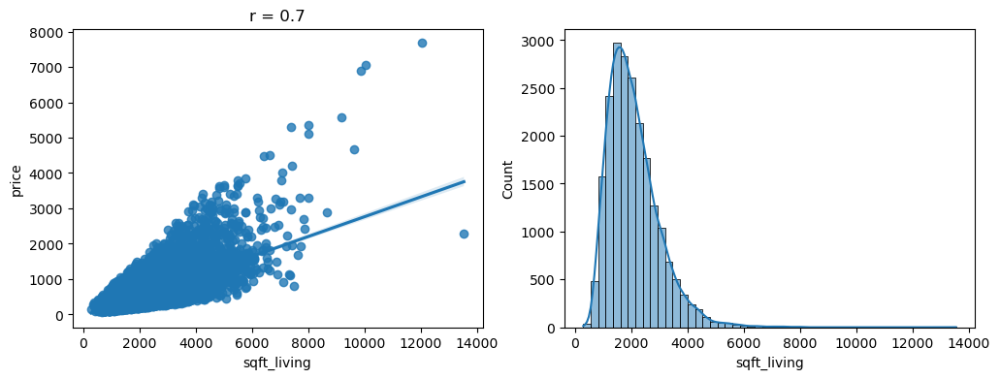

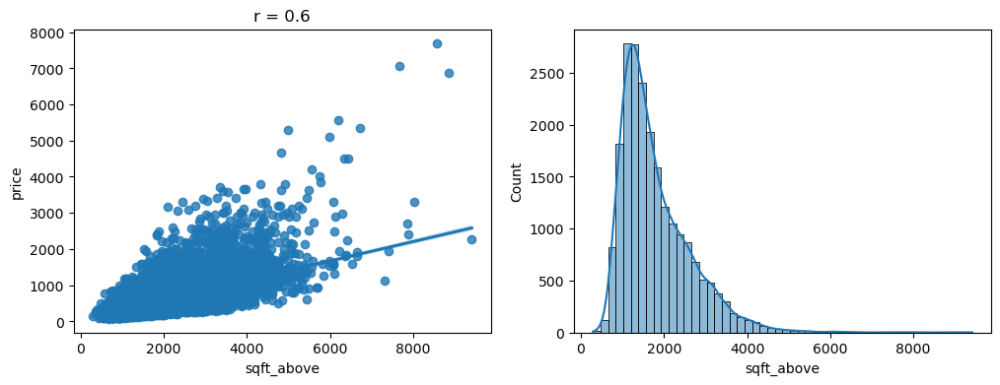

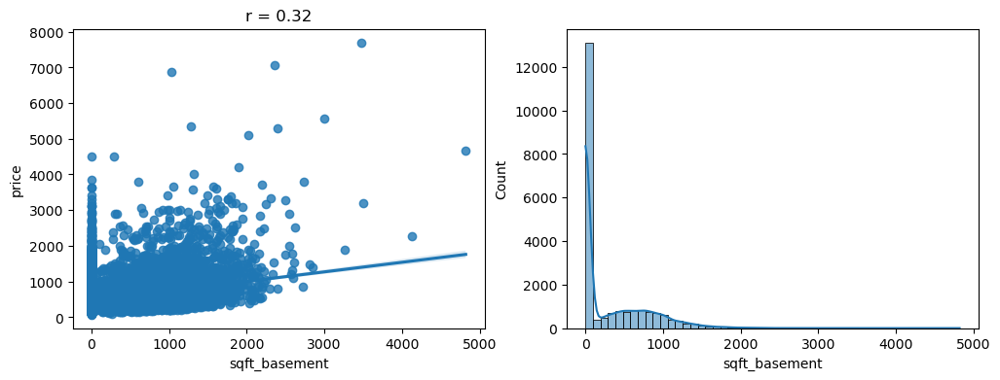

In [24]:
num_var = ['sqft_living', 'sqft_above', 'sqft_basement']

for var in num_var:
    fig, ax = plt.subplots(1, 2, figsize=(6*2, 4))
    sns.regplot(data=df, x=var, y=target, ax=ax[0])
    ax[0].set_title(f"r = {corr_matrix[target][var]}")
    sns.histplot(data=df, x=var, bins=50, kde=True, ax=ax[1])

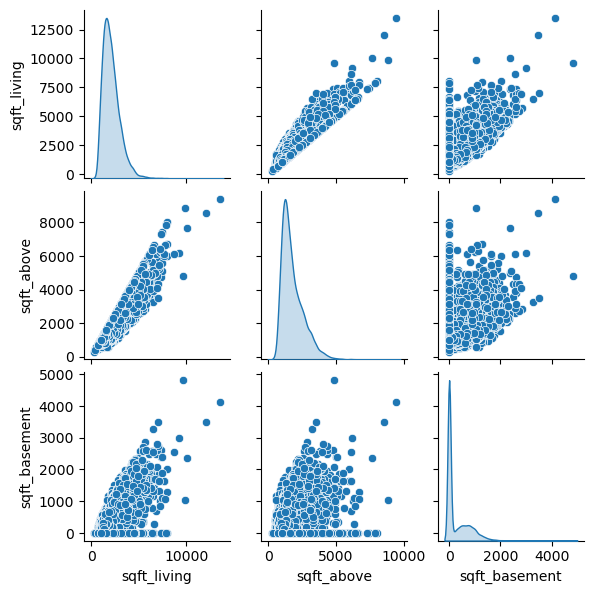

In [25]:
sns.pairplot(df[num_var], height=2, kind="scatter", diag_kind="kde");

Все три показателя связаны с площадью застройки, причем площади наземной и подземной частей составлюят общую жилую площадь.\
В данном случае можно говорить о заметной прямой линейной связи между стоимостью дома и жилой площадью.

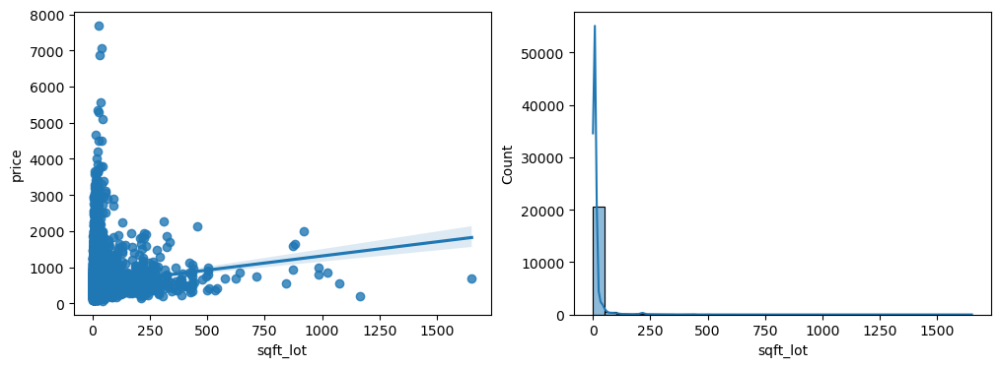

In [26]:
fig, ax = plt.subplots(1, 2, figsize=(6*2, 4))

sns.regplot(data=df, x=df['sqft_lot']/1000, y=target, ax=ax[0])
sns.histplot(data=df, x=df['sqft_lot']/1000, binwidth=50, kde=True, ax=ax[1]);

Большинство домов имеют маленький участок либо не имеют прилегающего участка, при этом у таких домов самый большой разброс цен.\
Площадь прилегающего участка не влияет на стоимость дома.

In [27]:
df['renovated'] = df['yr_renovated'].apply(lambda y: y>0).astype(int)
df['renovated'].value_counts(normalize=True)

renovated
0    0.957546
1    0.042454
Name: proportion, dtype: float64

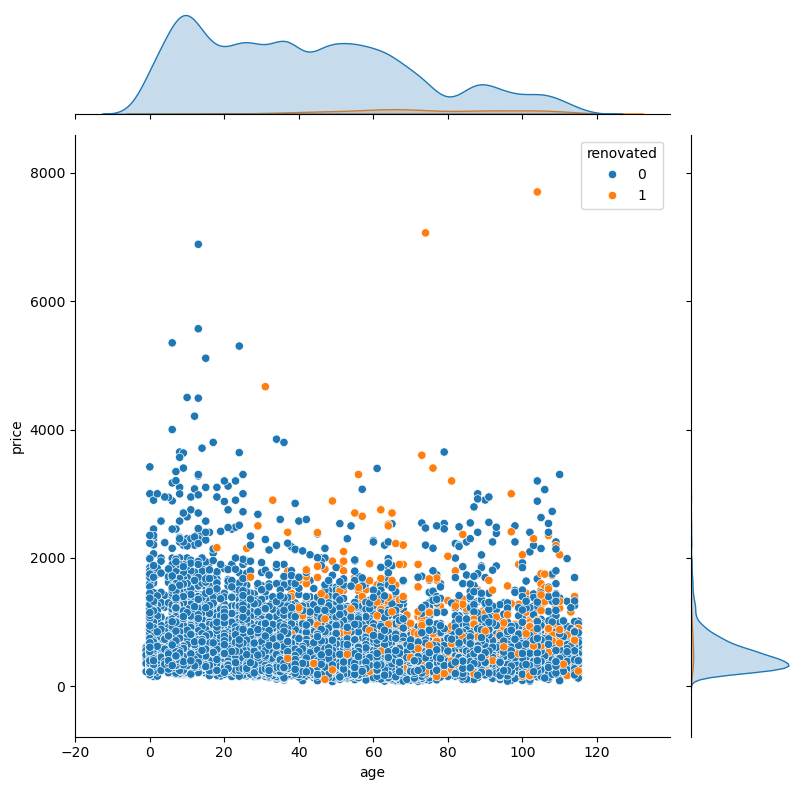

In [28]:
var = 'age'
sns.jointplot(data=df, x=var, y=target, hue='renovated', height=8);

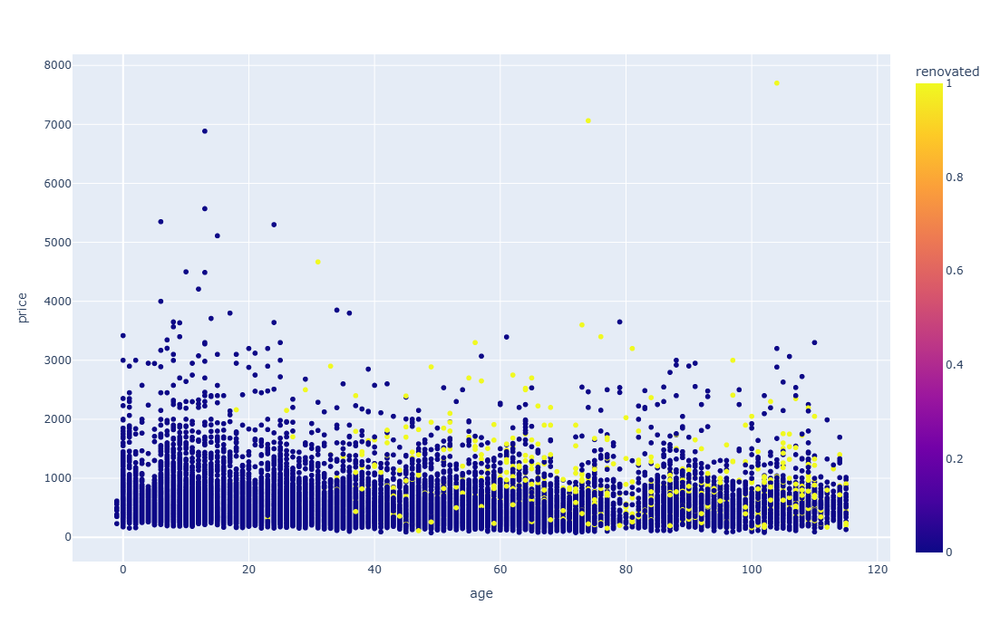

In [29]:
px.scatter(df, x='age', y='price', color='renovated', hover_data=['yr_renovated'],
           width=800, height=700)

Цены на дома равномерно распределены по "возрасту" дома, что указывает на отсутствие зависимости.\
Наличие реконструкции (ремонта) в целом не влиет на стоимость домов.

In [30]:
def cat_plot(var, explode):
    fig, ax = plt.subplots(1, 2, figsize=(7.5*2, 4), gridspec_kw = {'width_ratios': (.6, .4)})
    data = df[var].value_counts()
    explode = explode
    ax[0].pie(data, labels=data.index, autopct='%1.1f%%', explode=explode)
    sns.countplot(data=df, x=var, order=data.index, palette="tab10", ax=ax[1])

    fig, ax = plt.subplots(1, 2, figsize=(6*2, 4))
    order = df.groupby(var).agg({target: 'mean'}).sort_values(target).index
    sns.boxplot(data=df, x=var, y=target, order=order, palette="tab10", ax=ax[0])
    r = stats.spearmanr(df[var], df[target])
    sns.violinplot(data=df, y=target, x=var, hue='waterfront', split=True, inner='quartile', order=order, palette="tab10", ax=ax[1])
    ax[1].set_title(f"r = {r[0]:.2f}")
    
    plt.show()

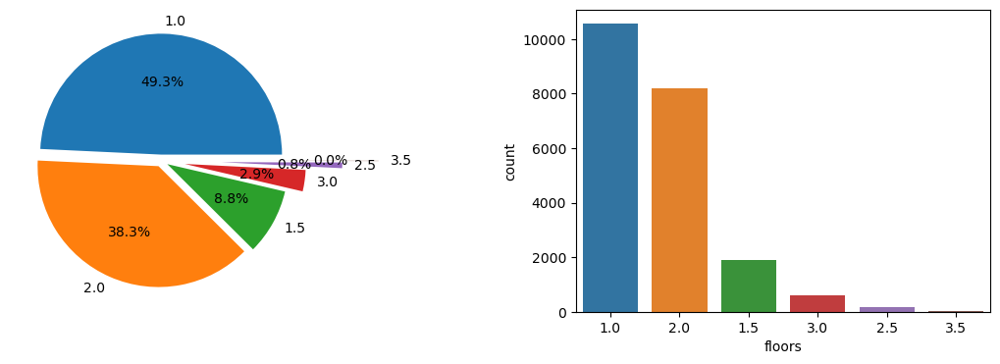

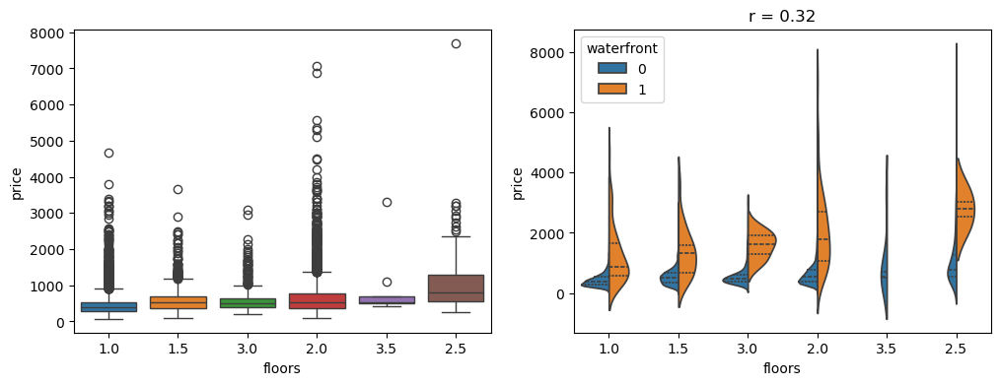

In [31]:
var = 'floors'
cat_plot(var, [0.05, 0.05, 0.06, 0.2, 0.5, 0.8])

Большинство проданых домов имеют 1 или 2 этажа. Дома с 2.5 этажами в среднем стоят дороже.\
Дома с видом на набережную (waterfront) продаются дороже, чем дома с аналогичным количеством этажей.\
Количество этажей слабо влияет на цену дома.

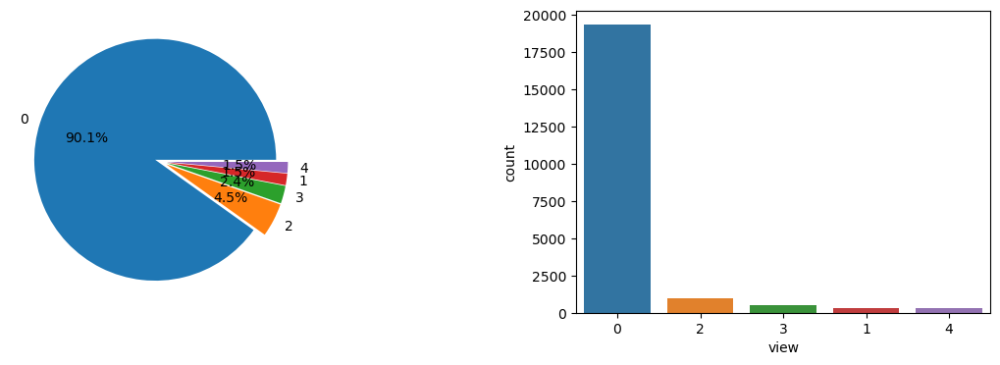

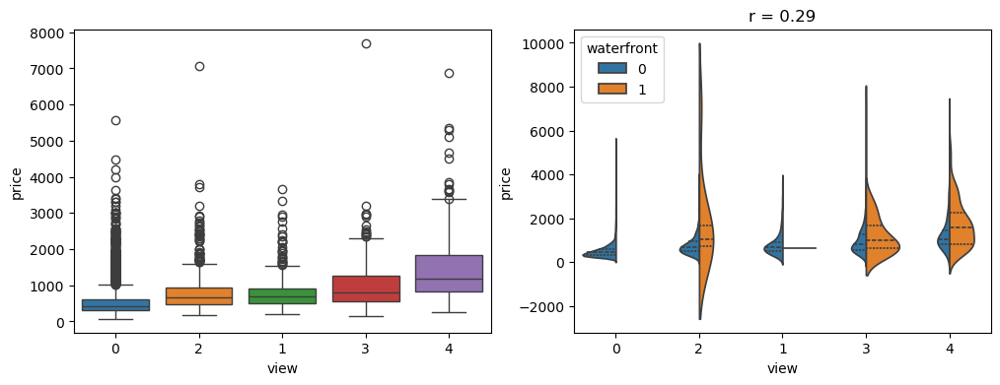

In [32]:
var = 'view'
explode = [0.05]*df[var].nunique()
cat_plot(var, explode)

Больше всего продано домов с оценкой внешнего вида (view) 0 и они же в среднем дешевле других домов.\
Стоимость домов с оценкой 4 в среднем выше, чем у домов с более низкими оценками.\
Вид на набережную слабо влияет на цену дома при группировке по внешнему виду.\
Оценка внешнего вида слабо влияет на цену дома.

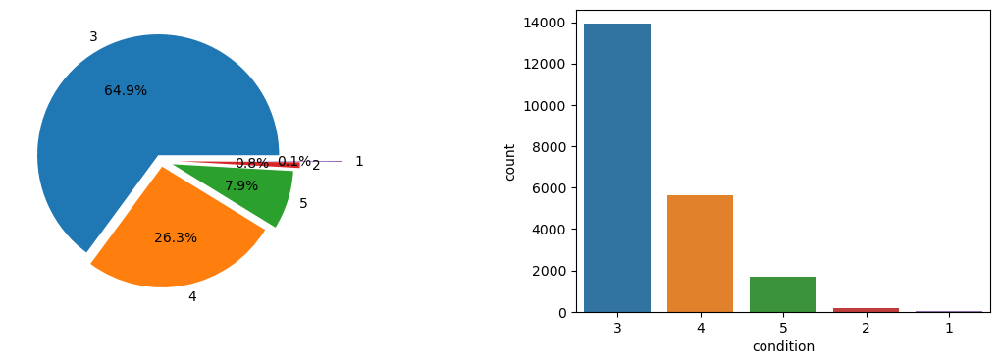

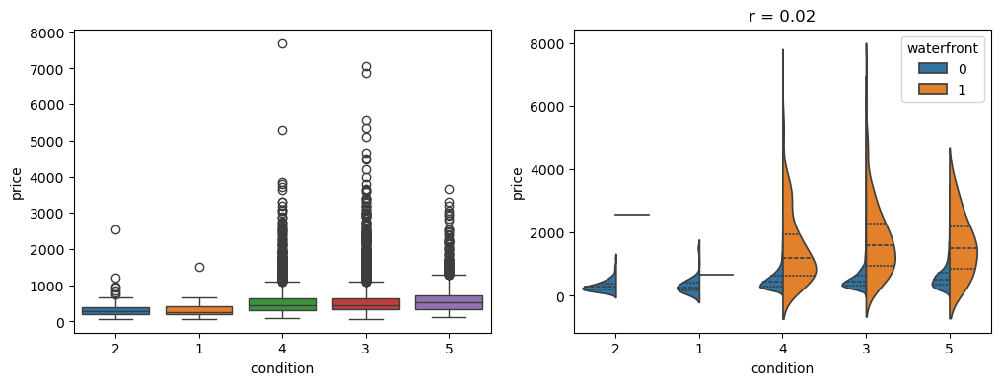

In [33]:
var = 'condition'
explode = [0.05, 0.05, 0.1, 0.15, 0.5]
cat_plot(var, explode)

Оценка состояния (condition) не влияет на цену, при этом чаще продаются дома со средней оценкой и выше среднего.\
Дома с видом на набережную в среднем стоя дороже домов с аналогичной оценкой сотояния.

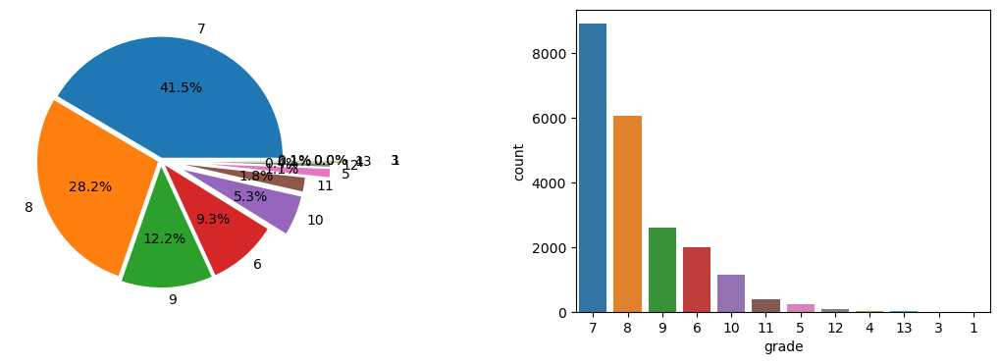

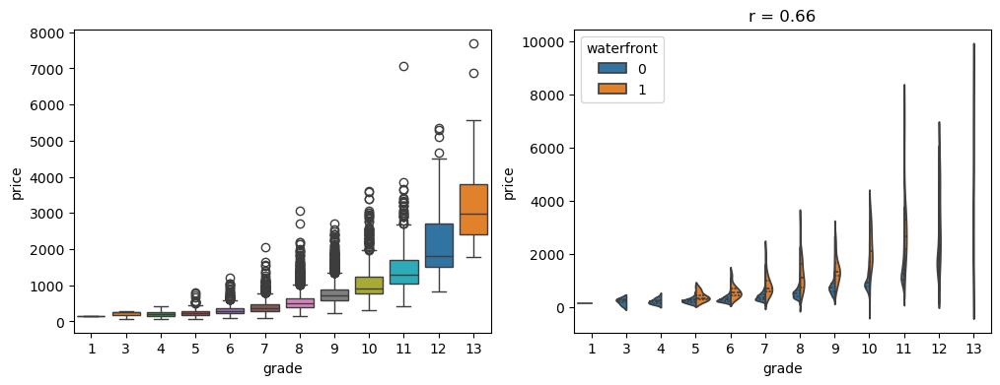

In [34]:
var = 'grade'
d = 5
n, m = df[var].nunique()//d, df[var].nunique()%d
explode = sum([e*i for i,e in zip([[0.025],[0.05],[0.2],[0.4],[0.5],[0.8]],[n]*d + [m])],[])
cat_plot(var, explode)

В основном покупают дома с 7-9 оценками качества строительства и дизайна (grade).\
Наблюдается значительный рост стоимости дома с ростом оценки качества (экпоненциальная зависимость?).\
Вид на набережную также имеет значительное влияние на стоимость дома при одинаковой оценке качества.\
Оценками качества строительства и дизайна заметно влияет на цену дома.

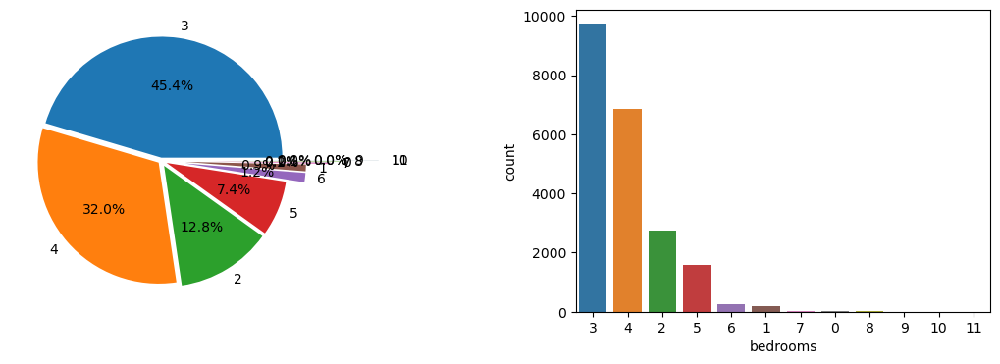

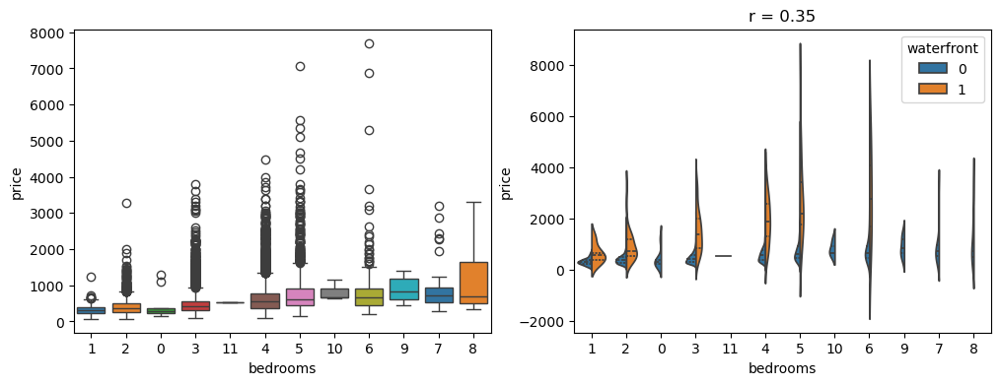

In [35]:
var = 'bedrooms'
d = 5
n, m = df[var].nunique()//d, df[var].nunique()%d
explode = sum([e*i for i,e in zip([[0.025],[0.05],[0.2],[0.4],[0.5],[0.8]],[n]*d + [m])],[])
cat_plot(var, explode)

Больше всего продано домов с 3 и 4 спальнями.\
Количество спален слабо влияет на стоимость дома.

Сгруппируем кол-во ванных комнат (0.25 - комната с туалетом, 0.5 - комната с туалетом и раковиной) по числу ванных.

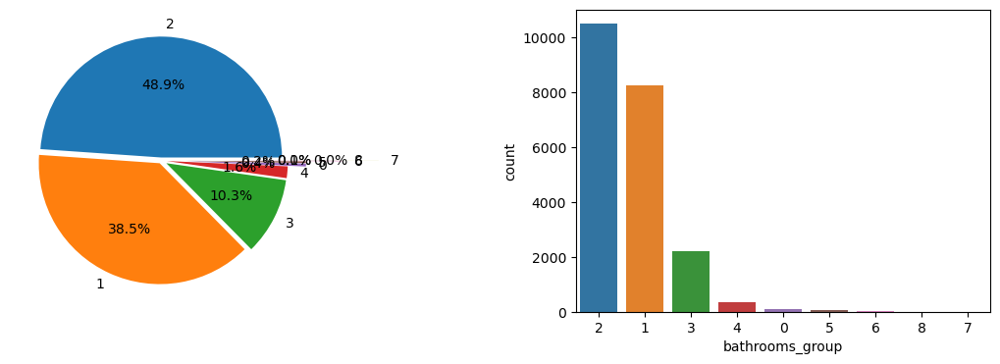

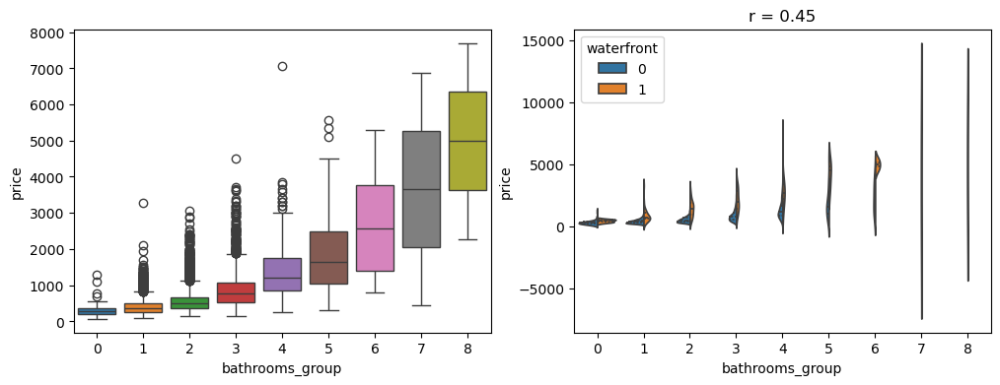

In [36]:
df['bathrooms_group'] = df['bathrooms'].astype(int)
var = 'bathrooms_group'
d = 4
n, m = df[var].nunique()//d, df[var].nunique()%d
explode = sum([e*i for i,e in zip([[0.025],[0.05],[0.2],[0.5],[0.8]],[n]*d + [m])],[])
cat_plot(var, explode)

По количеству ванных комнат больше всего продано домов с 1-ой или 2-мя ванными, значительно меньше с 3-мя.\
Количества ванных комнат заметно влияет на стоимость дома.

Посмотрим распределние стоимости недвижимости в зависимости от местонахождения.\
Разделим стоимость домов на группы: до 350 тыс.дол. (low), от 350 до 650 тыс.дол. (middle), больше 650 тыс.дол. (high).

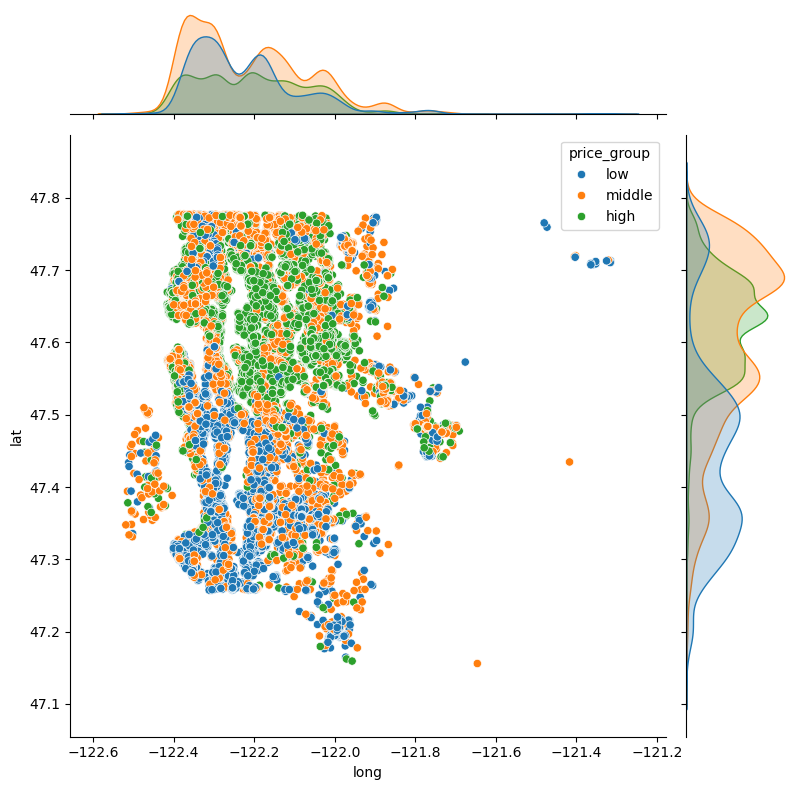

In [37]:
df['price_group'] = pd.cut(df['price'],
                           bins=[0,350,650,np.inf],
                           right=False,
                           labels=['low','middle','high'])
sns.jointplot(data=df, x='long', y='lat', hue='price_group', height=8);

Дома стоимостью до 350 тыс.дол. присутствуют во всех районах округа с преобладанием в южной части. \
Дома стоимостью от 350 до 650 тыс.дол. присутствуют во всех районах округа с преобладанием в северной части. \
Практически все дома стоимостью больше 650 тыс.дол. находятся в северной части округа.

In [38]:
df['sqft_price'] = round(df['price'] * 1000 / df['sqft_living'],0)
df['sqft_price'].describe()

count    21435.000000
mean       264.715792
std        109.965405
min         88.000000
25%        183.000000
50%        245.000000
75%        319.000000
max        810.000000
Name: sqft_price, dtype: float64

Разделим цены за 1 кв.м. на три группы: до 200, от 200 до 320, от 320.\
Построим график распределения домов по широте и доготе.

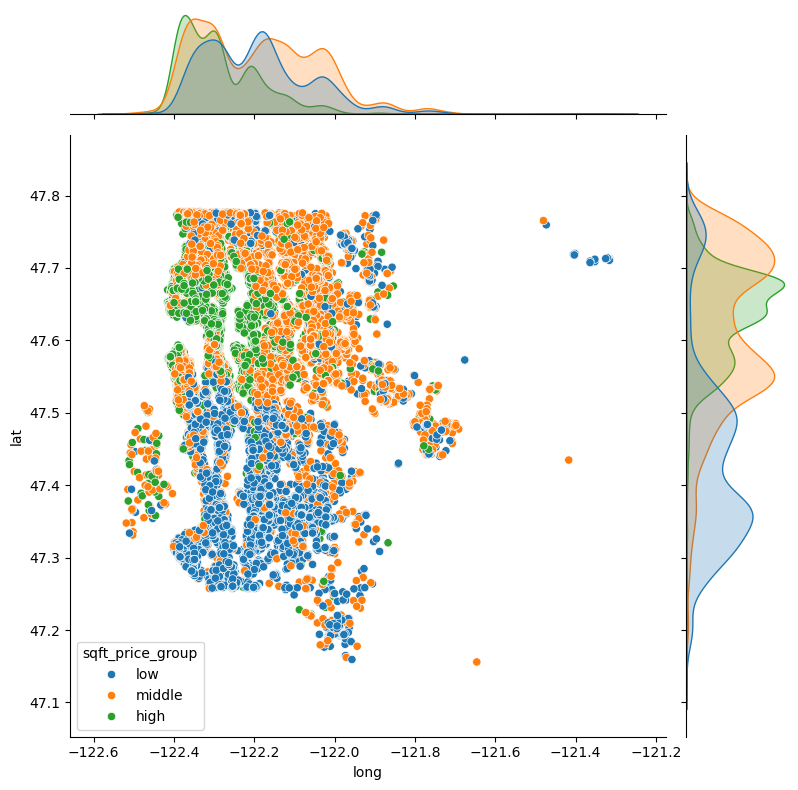

In [40]:
df['sqft_price_group'] = pd.cut(df['sqft_price'],
                                bins=[0,200,320,np.inf],
                                right=False,
                                labels=['low','middle','high'])#.astype(int)

sns.jointplot(data=df, x='long', y='lat', hue='sqft_price_group', height=8);

Распределение стоимости 1 кв.м. в зависимости от местонахождения дома практически повторяет распределение стоимости недвижимости.\
Можно предположить, что дома с высокой ценой сосредоточены в районе экономического и/или административного центра округа.\
Местонахождение дома (удаленность от центра) имеет большое влияние на стоимость недвижимости.

Сформируем интерактивную карту.

In [41]:
config = {
    "version": "v1",
    'config': {
        'mapState': {
            'latitude': 47.5,
            'longitude': -122.0,
            'zoom': 9.6
        }
    }
}

kmap = KeplerGl(config=config, height=700)
kmap.add_data(df, 'kc_house_data')

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


In [42]:
kmap.save_to_html(config=config, file_name='./king.html')

Map saved to ./king.html!
